### Imports and Hyperparameters

In [1]:
import imgaug as ia
import matplotlib.pyplot as plt
import numpy as np
import os
import sys
import tensorflow as tf

root_path = os.path.abspath(os.path.join('..'))
if root_path not in sys.path:
    sys.path.append(root_path)

%matplotlib inline

In [2]:
import config

### A visualization helper function

In [3]:
def display_image(image, boxes=None, box_color=[0, 0, 255], box_thickness=3, ax=None):
    image = np.array(image)
    
    if boxes is not None:
        boxes = np.array(boxes)[..., :5]
        boxes = [ia.BoundingBox(x1=x1, y1=y1, x2=x2, y2=y2, label=config.CLASSES[int(label)])
                 for x1, y1, x2, y2, label in boxes]
        boxes = ia.BoundingBoxesOnImage(boxes, shape=image.shape)
        image = boxes.draw_on_image(image, color=box_color,
                                    size=box_thickness)
    
    if ax is None:
        plt.imshow(image)
        plt.axis('off')
        plt.show()
    else:
        ax.imshow(image)
        ax.axis('off')

### Load and visualize some image

Visualize some REAL images with their boxes for sanity checking 

Loaded 10345 image samples
Loaded 1000 image samples


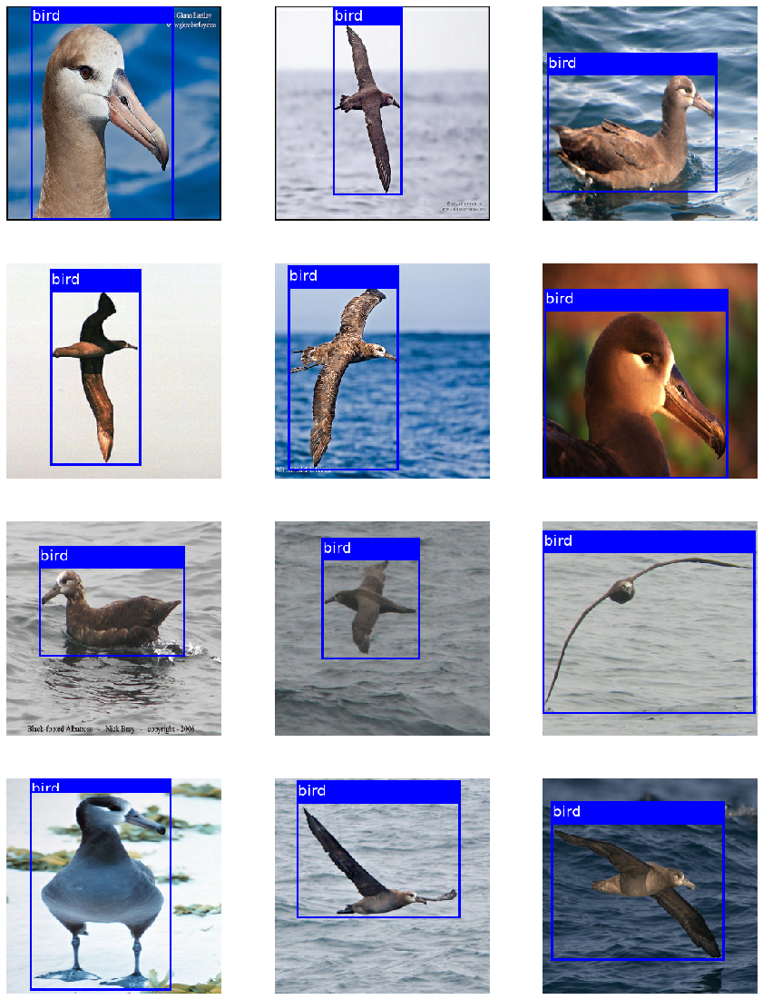

In [4]:
from birds_loader import load_birds, build_dataset

train_image_paths, train_bnd_boxes = load_birds(split='train')
valid_image_paths, valid_bnd_boxes = load_birds(split='valid')
data = build_dataset(train_image_paths, train_bnd_boxes,
                    image_size=config.IMAGE_SIZE)

num_display = 12
num_cols = 3
num_rows = (num_display+1) // num_cols

fig, _ = plt.subplots(num_rows, num_cols, figsize=(5*num_cols, 5*num_rows))

data_iter = iter(data)

for idx in range(num_display):
    x, y = next(data_iter)
    display_image(x, y.to_tensor(), ax=fig.axes[idx])
    
plt.show()

Loaded 10000 image samples


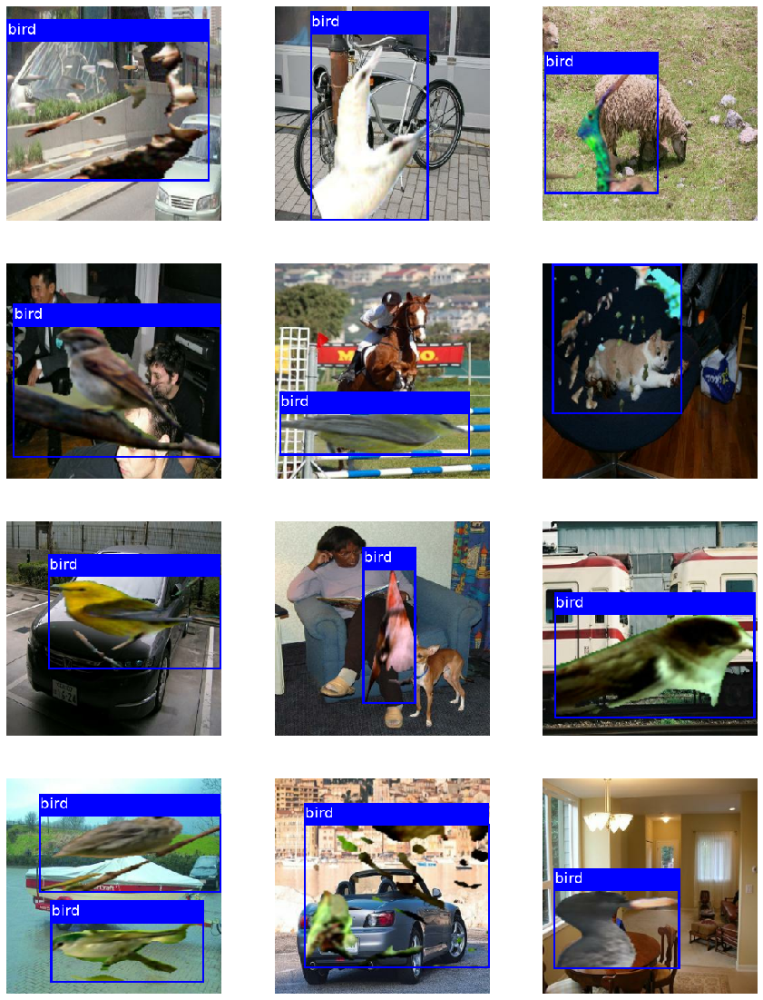

In [5]:
from birds_loader import load_birds, build_dataset

fake_image_paths, fake_bnd_boxes = load_birds(
    root=os.path.join('..', 'data', 'birds_fake'),
    split='fake')

data = build_dataset(fake_image_paths, fake_bnd_boxes,
                    image_size=config.IMAGE_SIZE)

num_display = 12
num_cols = 3
num_rows = (num_display+1) // num_cols

fig, _ = plt.subplots(num_rows, num_cols, figsize=(5*num_cols, 5*num_rows))

data_iter = iter(data)

for idx in range(num_display):
    x, y = next(data_iter)
    display_image(x, y.to_tensor(), ax=fig.axes[idx])
    
plt.show()

## MobileNet

### Instantiate the model

In [6]:
from ssd_utils.networks.ssd_mobilenet import SSDMobileNet

model = SSDMobileNet(num_classes=len(config.CLASSES), name='ssd_mobilenet')

### Create the data pipelines

In [7]:
anchors = model.get_anchors(image_shape=config.IMAGE_SIZE + (3,))

fake_data = build_dataset(fake_image_paths, fake_bnd_boxes,
                          image_size=config.IMAGE_SIZE,
                          batch_size=config.BATCH_SIZE,
                          repeat=True, shuffle=True,
                          encode_output=True,
                          anchors=anchors,
                          model=model)

train_data = build_dataset(train_image_paths, train_bnd_boxes,
                           image_size=config.IMAGE_SIZE,
                           batch_size=config.BATCH_SIZE,
                           repeat=True, shuffle=True,
                           encode_output=True,
                           anchors=anchors,
                           model=model)

valid_data = build_dataset(valid_image_paths, valid_bnd_boxes,
                           image_size=config.IMAGE_SIZE,
                           batch_size=config.BATCH_SIZE,
                           repeat=False, shuffle=False,
                           encode_output=False)

for data in [fake_data, train_data, valid_data]:
    x, y = next(iter(data))
    print(x.shape, y.shape)

(16, 300, 300, 3) (16, 2430, 6)
(16, 300, 300, 3) (16, 2430, 6)
(16, 300, 300, 3) (16, None, None)


### Pretrain the model on fake data

In [9]:
from ssd_utils.ssd_loss import SSDLoss
from ssd_utils.metrics import MeanAveragePrecision
from tensorflow.keras.callbacks import ModelCheckpoint

from ssd_utils import output_encoder
from utils import MeanAveragePrecisionCallback

ssd_loss = SSDLoss()
        
meanAP_callback = MeanAveragePrecisionCallback(data=valid_data,
                                               anchors=anchors)

ckpt_callback = ModelCheckpoint('mobilenet_pretrain.h5',
                                monitor='val_meanAP',
                                mode='max',
                                save_best_only=True,
                                save_weights_only=True)        

        
model.compile(optimizer=tf.keras.optimizers.Adam(1e-4),
              loss=ssd_loss)

history = model.fit(fake_data, epochs=config.NUM_EPOCHS_PRETRAIN,
          steps_per_epoch=config.STEPS_PER_EPOCH,
          callbacks=[meanAP_callback, ckpt_callback])

Epoch 1/40
25/25 [==============================] - ETA: 0s - loss: 23.0603

Calculating Average Precision...: 0it [00:00, ?it/s]


Calculating Average Precision for class 1.0


Calculating Average Precision...: 1000it [00:00, 1705.24it/s]


25/25 [==============================] - 32s 1s/step - loss: 23.0603 - val_meanAP: 0.0048
Epoch 2/40
25/25 [==============================] - ETA: 0s - loss: 8.0015

Calculating Average Precision...: 90it [00:00, 884.72it/s]


Calculating Average Precision for class 1.0


Calculating Average Precision...: 1000it [00:01, 848.10it/s]


25/25 [==============================] - 26s 1s/step - loss: 8.0015 - val_meanAP: 0.0259
Epoch 3/40
25/25 [==============================] - ETA: 0s - loss: 6.5662

Calculating Average Precision...: 72it [00:00, 713.86it/s]


Calculating Average Precision for class 1.0


Calculating Average Precision...: 1000it [00:02, 464.13it/s]


25/25 [==============================] - 31s 1s/step - loss: 6.5662 - val_meanAP: 0.0338
Epoch 4/40
25/25 [==============================] - ETA: 0s - loss: 5.5980

Calculating Average Precision...: 42it [00:00, 410.66it/s]


Calculating Average Precision for class 1.0


Calculating Average Precision...: 1000it [00:04, 226.07it/s]


25/25 [==============================] - 37s 1s/step - loss: 5.5980 - val_meanAP: 0.0642
Epoch 5/40
25/25 [==============================] - ETA: 0s - loss: 4.8705

Calculating Average Precision...: 42it [00:00, 391.27it/s]


Calculating Average Precision for class 1.0


Calculating Average Precision...: 1000it [00:05, 199.78it/s]


25/25 [==============================] - 38s 2s/step - loss: 4.8705 - val_meanAP: 0.0774
Epoch 6/40
25/25 [==============================] - ETA: 0s - loss: 4.2093

Calculating Average Precision...: 41it [00:00, 393.36it/s]


Calculating Average Precision for class 1.0


Calculating Average Precision...: 1000it [00:04, 245.80it/s]


25/25 [==============================] - 35s 1s/step - loss: 4.2093 - val_meanAP: 0.0850
Epoch 7/40
25/25 [==============================] - ETA: 0s - loss: 3.6369

Calculating Average Precision...: 43it [00:00, 422.70it/s]


Calculating Average Precision for class 1.0


Calculating Average Precision...: 1000it [00:04, 241.72it/s]


25/25 [==============================] - 34s 1s/step - loss: 3.6369 - val_meanAP: 0.1113
Epoch 8/40
25/25 [==============================] - ETA: 0s - loss: 3.3392

Calculating Average Precision...: 48it [00:00, 470.02it/s]


Calculating Average Precision for class 1.0


Calculating Average Precision...: 1000it [00:02, 347.92it/s]


25/25 [==============================] - 30s 1s/step - loss: 3.3392 - val_meanAP: 0.1409
Epoch 9/40
25/25 [==============================] - ETA: 0s - loss: 3.0713

Calculating Average Precision...: 46it [00:00, 445.92it/s]


Calculating Average Precision for class 1.0


Calculating Average Precision...: 1000it [00:03, 317.85it/s]


25/25 [==============================] - 35s 1s/step - loss: 3.0713 - val_meanAP: 0.1723
Epoch 10/40
25/25 [==============================] - ETA: 0s - loss: 2.8268

Calculating Average Precision...: 43it [00:00, 424.07it/s]


Calculating Average Precision for class 1.0


Calculating Average Precision...: 1000it [00:03, 288.61it/s]

25/25 [==============================] - 33s 1s/step - loss: 2.8268 - val_meanAP: 0.1631


Epoch 11/40
25/25 [==============================] - ETA: 0s - loss: 2.6563

Calculating Average Precision...: 47it [00:00, 464.93it/s]


Calculating Average Precision for class 1.0


Calculating Average Precision...: 1000it [00:02, 350.19it/s]

25/25 [==============================] - 31s 1s/step - loss: 2.6563 - val_meanAP: 0.1562


Epoch 12/40
25/25 [==============================] - ETA: 0s - loss: 2.5077

Calculating Average Precision...: 46it [00:00, 443.14it/s]


Calculating Average Precision for class 1.0


Calculating Average Precision...: 1000it [00:03, 304.49it/s]


25/25 [==============================] - 34s 1s/step - loss: 2.5077 - val_meanAP: 0.1891
Epoch 13/40
25/25 [==============================] - ETA: 0s - loss: 2.3620

Calculating Average Precision...: 44it [00:00, 422.27it/s]


Calculating Average Precision for class 1.0


Calculating Average Precision...: 1000it [00:03, 332.09it/s]


25/25 [==============================] - 32s 1s/step - loss: 2.3620 - val_meanAP: 0.2039
Epoch 14/40
25/25 [==============================] - ETA: 0s - loss: 2.2840

Calculating Average Precision...: 44it [00:00, 426.31it/s]


Calculating Average Precision for class 1.0


Calculating Average Precision...: 1000it [00:02, 337.34it/s]


25/25 [==============================] - 34s 1s/step - loss: 2.2840 - val_meanAP: 0.2414
Epoch 15/40
25/25 [==============================] - ETA: 0s - loss: 2.1555

Calculating Average Precision...: 51it [00:00, 509.69it/s]


Calculating Average Precision for class 1.0


Calculating Average Precision...: 1000it [00:02, 444.11it/s]

25/25 [==============================] - 32s 1s/step - loss: 2.1555 - val_meanAP: 0.2343


Epoch 16/40
25/25 [==============================] - ETA: 0s - loss: 2.2114

Calculating Average Precision...: 65it [00:00, 626.00it/s]


Calculating Average Precision for class 1.0


Calculating Average Precision...: 1000it [00:02, 477.28it/s]


25/25 [==============================] - 29s 1s/step - loss: 2.2114 - val_meanAP: 0.2749
Epoch 17/40
25/25 [==============================] - ETA: 0s - loss: 2.0256

Calculating Average Precision...: 68it [00:00, 667.99it/s]


Calculating Average Precision for class 1.0


Calculating Average Precision...: 1000it [00:02, 459.68it/s]

25/25 [==============================] - 27s 1s/step - loss: 2.0256 - val_meanAP: 0.2478


Epoch 18/40
25/25 [==============================] - ETA: 0s - loss: 2.0001

Calculating Average Precision...: 68it [00:00, 657.03it/s]


Calculating Average Precision for class 1.0


Calculating Average Precision...: 1000it [00:02, 489.35it/s]

25/25 [==============================] - 30s 1s/step - loss: 2.0001 - val_meanAP: 0.2670


Epoch 19/40
25/25 [==============================] - ETA: 0s - loss: 1.9282

Calculating Average Precision...: 65it [00:00, 649.34it/s]


Calculating Average Precision for class 1.0


Calculating Average Precision...: 1000it [00:01, 504.47it/s]

25/25 [==============================] - 28s 1s/step - loss: 1.9282 - val_meanAP: 0.2366


Epoch 20/40
25/25 [==============================] - ETA: 0s - loss: 1.9354

Calculating Average Precision...: 68it [00:00, 662.36it/s]


Calculating Average Precision for class 1.0


Calculating Average Precision...: 1000it [00:01, 519.00it/s]

25/25 [==============================] - 29s 1s/step - loss: 1.9354 - val_meanAP: 0.2307


Epoch 21/40
25/25 [==============================] - ETA: 0s - loss: 1.7945

Calculating Average Precision...: 56it [00:00, 554.94it/s]


Calculating Average Precision for class 1.0


Calculating Average Precision...: 1000it [00:02, 395.51it/s]

25/25 [==============================] - 30s 1s/step - loss: 1.7945 - val_meanAP: 0.2591


Epoch 22/40
25/25 [==============================] - ETA: 0s - loss: 1.8475

Calculating Average Precision...: 65it [00:00, 641.99it/s]


Calculating Average Precision for class 1.0


Calculating Average Precision...: 1000it [00:02, 484.09it/s]

25/25 [==============================] - 28s 1s/step - loss: 1.8475 - val_meanAP: 0.2374


Epoch 23/40
25/25 [==============================] - ETA: 0s - loss: 1.8847

Calculating Average Precision...: 59it [00:00, 588.37it/s]


Calculating Average Precision for class 1.0


Calculating Average Precision...: 1000it [00:02, 404.92it/s]


25/25 [==============================] - 29s 1s/step - loss: 1.8847 - val_meanAP: 0.2371
Epoch 24/40
25/25 [==============================] - ETA: 0s - loss: 1.8060

Calculating Average Precision...: 73it [00:00, 712.82it/s]


Calculating Average Precision for class 1.0


Calculating Average Precision...: 1000it [00:01, 555.75it/s]

25/25 [==============================] - 25s 994ms/step - loss: 1.8060 - val_meanAP: 0.2266


Epoch 25/40
25/25 [==============================] - ETA: 0s - loss: 1.7348

Calculating Average Precision...: 71it [00:00, 704.10it/s]


Calculating Average Precision for class 1.0


Calculating Average Precision...: 1000it [00:01, 525.99it/s]

25/25 [==============================] - 25s 982ms/step - loss: 1.7348 - val_meanAP: 0.2068


Epoch 26/40
25/25 [==============================] - ETA: 0s - loss: 1.7070

Calculating Average Precision...: 72it [00:00, 704.72it/s]


Calculating Average Precision for class 1.0


Calculating Average Precision...: 1000it [00:01, 575.65it/s]

25/25 [==============================] - 24s 961ms/step - loss: 1.7070 - val_meanAP: 0.2141


Epoch 27/40
25/25 [==============================] - ETA: 0s - loss: 1.6276

Calculating Average Precision...: 81it [00:00, 808.75it/s]


Calculating Average Precision for class 1.0


Calculating Average Precision...: 1000it [00:01, 627.03it/s]

25/25 [==============================] - 23s 916ms/step - loss: 1.6276 - val_meanAP: 0.2162


Epoch 28/40
25/25 [==============================] - ETA: 0s - loss: 1.6200

Calculating Average Precision...: 59it [00:00, 585.37it/s]


Calculating Average Precision for class 1.0


Calculating Average Precision...: 1000it [00:01, 571.95it/s]

25/25 [==============================] - 24s 976ms/step - loss: 1.6200 - val_meanAP: 0.2426


Epoch 29/40
25/25 [==============================] - ETA: 0s - loss: 1.5695

Calculating Average Precision...: 89it [00:00, 887.03it/s]


Calculating Average Precision for class 1.0


Calculating Average Precision...: 1000it [00:01, 653.16it/s]

25/25 [==============================] - 23s 929ms/step - loss: 1.5695 - val_meanAP: 0.2312


Epoch 30/40
25/25 [==============================] - ETA: 0s - loss: 1.5148

Calculating Average Precision...: 88it [00:00, 876.48it/s]


Calculating Average Precision for class 1.0


Calculating Average Precision...: 1000it [00:01, 652.30it/s]

25/25 [==============================] - 23s 914ms/step - loss: 1.5148 - val_meanAP: 0.2078


Epoch 31/40
25/25 [==============================] - ETA: 0s - loss: 1.4904

Calculating Average Precision...: 68it [00:00, 660.05it/s]


Calculating Average Precision for class 1.0


Calculating Average Precision...: 1000it [00:01, 541.95it/s]

25/25 [==============================] - 24s 958ms/step - loss: 1.4904 - val_meanAP: 0.2308


Epoch 32/40
25/25 [==============================] - ETA: 0s - loss: 1.5022

Calculating Average Precision...: 89it [00:00, 875.38it/s]


Calculating Average Precision for class 1.0


Calculating Average Precision...: 1000it [00:01, 767.75it/s]

25/25 [==============================] - 22s 892ms/step - loss: 1.5022 - val_meanAP: 0.2259


Epoch 33/40
25/25 [==============================] - ETA: 0s - loss: 1.5181

Calculating Average Precision...: 101it [00:00, 990.75it/s]


Calculating Average Precision for class 1.0


Calculating Average Precision...: 1000it [00:01, 954.27it/s]

25/25 [==============================] - 21s 843ms/step - loss: 1.5181 - val_meanAP: 0.2301


Epoch 34/40
25/25 [==============================] - ETA: 0s - loss: 1.4210

Calculating Average Precision...: 89it [00:00, 887.65it/s]


Calculating Average Precision for class 1.0


Calculating Average Precision...: 1000it [00:01, 768.53it/s]

25/25 [==============================] - 22s 870ms/step - loss: 1.4210 - val_meanAP: 0.1936


Epoch 35/40
25/25 [==============================] - ETA: 0s - loss: 1.3478

Calculating Average Precision...: 94it [00:00, 938.23it/s]


Calculating Average Precision for class 1.0


Calculating Average Precision...: 1000it [00:01, 828.17it/s]

25/25 [==============================] - 22s 872ms/step - loss: 1.3478 - val_meanAP: 0.1904


Epoch 36/40
25/25 [==============================] - ETA: 0s - loss: 1.3937

Calculating Average Precision...: 97it [00:00, 957.56it/s]


Calculating Average Precision for class 1.0


Calculating Average Precision...: 1000it [00:01, 806.19it/s]

25/25 [==============================] - 22s 881ms/step - loss: 1.3937 - val_meanAP: 0.1710


Epoch 37/40
25/25 [==============================] - ETA: 0s - loss: 1.3333

Calculating Average Precision...: 91it [00:00, 900.47it/s]


Calculating Average Precision for class 1.0


Calculating Average Precision...: 1000it [00:01, 899.31it/s]

25/25 [==============================] - 22s 871ms/step - loss: 1.3333 - val_meanAP: 0.1761


Epoch 38/40
25/25 [==============================] - ETA: 0s - loss: 1.3676

Calculating Average Precision...: 73it [00:00, 722.27it/s]


Calculating Average Precision for class 1.0


Calculating Average Precision...: 1000it [00:01, 680.34it/s]

25/25 [==============================] - 23s 913ms/step - loss: 1.3676 - val_meanAP: 0.2235


Epoch 39/40
25/25 [==============================] - ETA: 0s - loss: 1.2741

Calculating Average Precision...: 98it [00:00, 965.76it/s]


Calculating Average Precision for class 1.0


Calculating Average Precision...: 1000it [00:01, 953.02it/s]


25/25 [==============================] - 23s 913ms/step - loss: 1.2741 - val_meanAP: 0.2831
Epoch 40/40
25/25 [==============================] - ETA: 0s - loss: 1.2557

Calculating Average Precision...: 103it [00:00, 1012.69it/s]


Calculating Average Precision for class 1.0


Calculating Average Precision...: 1000it [00:00, 1033.10it/s]

25/25 [==============================] - 22s 870ms/step - loss: 1.2557 - val_meanAP: 0.2289


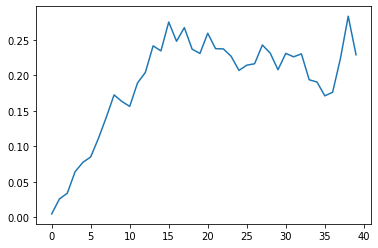

In [10]:
plt.plot(history.history['val_meanAP'])

Calculating Average Precision...: 96it [00:00, 956.73it/s]


Calculating Average Precision for class 1.0


Calculating Average Precision...: 1000it [00:01, 900.71it/s]


Validation meanAP: tf.Tensor(0.2830522456478529, shape=(), dtype=float64)


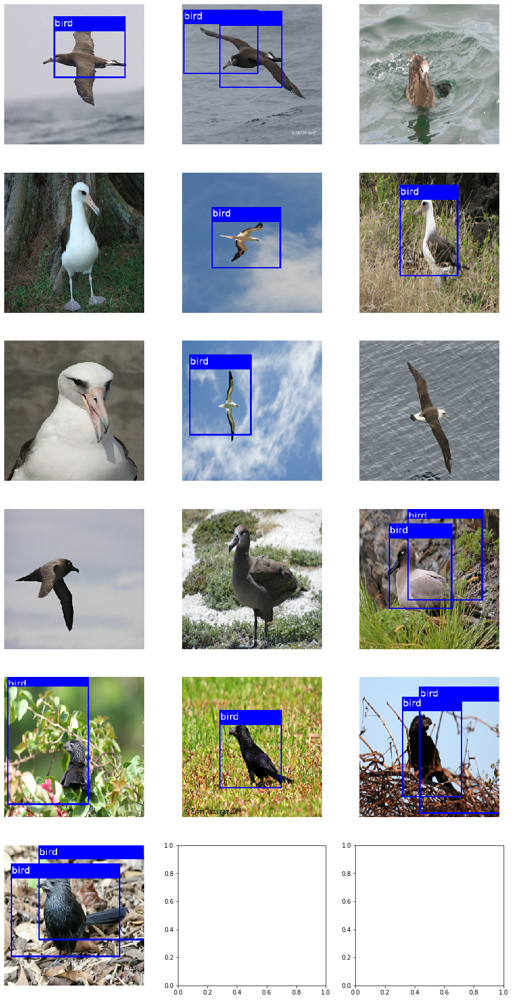

In [11]:
from ssd_utils.metrics import MeanAveragePrecision

mean_AP_metric = MeanAveragePrecision()

model_file = 'mobilenet_pretrain.h5'
model.load_weights(model_file)

for x, y_true in valid_data:
    predictions = [output_encoder.decode(y, anchors, model)
                   for y in model(x)]
    ground_truth = [y.to_tensor() for y in y_true]
    mean_AP_metric.update_state(ground_truth, predictions)

print('Validation meanAP:', mean_AP_metric.result())
mean_AP_metric.reset_state()     

num_display = 16
num_cols = 3
num_rows = (num_display+num_cols-1) // num_cols

fig, _ = plt.subplots(num_rows, num_cols, figsize=(5*num_cols, 5*num_rows))

X, Y = next(iter(valid_data))
Y_pred = model(X)

for idx in range(num_display):
    x = X[idx]
    y = output_encoder.decode(Y_pred[idx], anchors, model)
    display_image(x, y, ax=fig.axes[idx])
    
plt.show()

### Fintetune the model on real data

In [12]:
from ssd_utils.ssd_loss import SSDLoss
from ssd_utils.metrics import MeanAveragePrecision
from tensorflow.keras.callbacks import ModelCheckpoint

from ssd_utils import output_encoder
from utils import MeanAveragePrecisionCallback

ssd_loss = SSDLoss()
        
meanAP_callback = MeanAveragePrecisionCallback(data=valid_data,
                                               anchors=anchors)

ckpt_callback = ModelCheckpoint('mobilenet_finetune.h5',
                                monitor='val_meanAP',
                                mode='max',
                                save_best_only=True,
                                save_weights_only=True)        

        
model.compile(optimizer=tf.keras.optimizers.Adam(1e-4),
              loss=ssd_loss)

history = model.fit(train_data, epochs=config.NUM_EPOCHS,
          steps_per_epoch=config.STEPS_PER_EPOCH,
          callbacks=[meanAP_callback, ckpt_callback])

Epoch 1/40
25/25 [==============================] - ETA: 0s - loss: 2.1351

Calculating Average Precision...: 94it [00:00, 928.64it/s]


Calculating Average Precision for class 1.0


Calculating Average Precision...: 1000it [00:01, 842.83it/s]


25/25 [==============================] - 30s 1s/step - loss: 2.1351 - val_meanAP: 0.4211
Epoch 2/40
25/25 [==============================] - ETA: 0s - loss: 1.6770

Calculating Average Precision...: 137it [00:00, 1359.31it/s]


Calculating Average Precision for class 1.0


Calculating Average Precision...: 1000it [00:00, 1484.38it/s]


25/25 [==============================] - 29s 1s/step - loss: 1.6770 - val_meanAP: 0.4823
Epoch 3/40
25/25 [==============================] - ETA: 0s - loss: 1.3391

Calculating Average Precision...: 60it [00:00, 592.38it/s]


Calculating Average Precision for class 1.0


Calculating Average Precision...: 1000it [00:01, 627.12it/s]


25/25 [==============================] - 34s 1s/step - loss: 1.3391 - val_meanAP: 0.7994
Epoch 4/40
25/25 [==============================] - ETA: 0s - loss: 1.1548

Calculating Average Precision...: 58it [00:00, 579.71it/s]


Calculating Average Precision for class 1.0


Calculating Average Precision...: 1000it [00:01, 641.99it/s]


25/25 [==============================] - 35s 1s/step - loss: 1.1548 - val_meanAP: 0.8452
Epoch 5/40
25/25 [==============================] - ETA: 0s - loss: 1.2590

Calculating Average Precision...: 70it [00:00, 688.79it/s]


Calculating Average Precision for class 1.0


Calculating Average Precision...: 1000it [00:01, 723.47it/s]

25/25 [==============================] - 33s 1s/step - loss: 1.2590 - val_meanAP: 0.8235


Epoch 6/40
25/25 [==============================] - ETA: 0s - loss: 1.2974

Calculating Average Precision...: 54it [00:00, 530.48it/s]


Calculating Average Precision for class 1.0


Calculating Average Precision...: 1000it [00:01, 538.58it/s]

25/25 [==============================] - 32s 1s/step - loss: 1.2974 - val_meanAP: 0.8224


Epoch 7/40
25/25 [==============================] - ETA: 0s - loss: 1.2032

Calculating Average Precision...: 74it [00:00, 734.62it/s]


Calculating Average Precision for class 1.0


Calculating Average Precision...: 1000it [00:01, 676.79it/s]

25/25 [==============================] - 33s 1s/step - loss: 1.2032 - val_meanAP: 0.8309


Epoch 8/40
25/25 [==============================] - ETA: 0s - loss: 0.8461

Calculating Average Precision...: 50it [00:00, 497.18it/s]


Calculating Average Precision for class 1.0


Calculating Average Precision...: 1000it [00:01, 549.11it/s]

25/25 [==============================] - 34s 1s/step - loss: 0.8461 - val_meanAP: 0.7716


Epoch 9/40
25/25 [==============================] - ETA: 0s - loss: 0.9646

Calculating Average Precision...: 71it [00:00, 707.44it/s]


Calculating Average Precision for class 1.0


Calculating Average Precision...: 1000it [00:01, 822.50it/s]


25/25 [==============================] - 31s 1s/step - loss: 0.9646 - val_meanAP: 0.8468
Epoch 10/40
25/25 [==============================] - ETA: 0s - loss: 0.9999

Calculating Average Precision...: 67it [00:00, 664.96it/s]


Calculating Average Precision for class 1.0


Calculating Average Precision...: 1000it [00:01, 656.47it/s]


25/25 [==============================] - 32s 1s/step - loss: 0.9999 - val_meanAP: 0.9503
Epoch 11/40
25/25 [==============================] - ETA: 0s - loss: 1.0246

Calculating Average Precision...: 72it [00:00, 716.39it/s]


Calculating Average Precision for class 1.0


Calculating Average Precision...: 1000it [00:01, 756.45it/s]

25/25 [==============================] - 32s 1s/step - loss: 1.0246 - val_meanAP: 0.9451


Epoch 12/40
25/25 [==============================] - ETA: 0s - loss: 0.9418

Calculating Average Precision...: 75it [00:00, 748.92it/s]


Calculating Average Precision for class 1.0


Calculating Average Precision...: 1000it [00:01, 804.68it/s]


25/25 [==============================] - 32s 1s/step - loss: 0.9418 - val_meanAP: 0.9527
Epoch 13/40
25/25 [==============================] - ETA: 0s - loss: 0.9127

Calculating Average Precision...: 56it [00:00, 550.89it/s]


Calculating Average Precision for class 1.0


Calculating Average Precision...: 1000it [00:01, 674.44it/s]


25/25 [==============================] - 33s 1s/step - loss: 0.9127 - val_meanAP: 0.9767
Epoch 14/40
25/25 [==============================] - ETA: 0s - loss: 0.8183

Calculating Average Precision...: 70it [00:00, 699.42it/s]


Calculating Average Precision for class 1.0


Calculating Average Precision...: 1000it [00:01, 761.31it/s]

25/25 [==============================] - 31s 1s/step - loss: 0.8183 - val_meanAP: 0.9580


Epoch 15/40
25/25 [==============================] - ETA: 0s - loss: 0.8240

Calculating Average Precision...: 81it [00:00, 799.83it/s]


Calculating Average Precision for class 1.0


Calculating Average Precision...: 1000it [00:01, 783.25it/s]

25/25 [==============================] - 31s 1s/step - loss: 0.8240 - val_meanAP: 0.9680


Epoch 16/40
25/25 [==============================] - ETA: 0s - loss: 0.7002

Calculating Average Precision...: 60it [00:00, 592.17it/s]


Calculating Average Precision for class 1.0


Calculating Average Precision...: 1000it [00:01, 567.43it/s]

25/25 [==============================] - 32s 1s/step - loss: 0.7002 - val_meanAP: 0.9656


Epoch 17/40
25/25 [==============================] - ETA: 0s - loss: 0.7094

Calculating Average Precision...: 76it [00:00, 748.64it/s]


Calculating Average Precision for class 1.0


Calculating Average Precision...: 1000it [00:01, 731.96it/s]

25/25 [==============================] - 32s 1s/step - loss: 0.7094 - val_meanAP: 0.9680


Epoch 18/40
25/25 [==============================] - ETA: 0s - loss: 0.7596

Calculating Average Precision...: 77it [00:00, 763.81it/s]


Calculating Average Precision for class 1.0


Calculating Average Precision...: 1000it [00:01, 793.36it/s]

25/25 [==============================] - 31s 1s/step - loss: 0.7596 - val_meanAP: 0.9681


Epoch 19/40
25/25 [==============================] - ETA: 0s - loss: 0.8680

Calculating Average Precision...: 41it [00:00, 406.99it/s]


Calculating Average Precision for class 1.0


Calculating Average Precision...: 1000it [00:01, 642.71it/s]

25/25 [==============================] - 32s 1s/step - loss: 0.8680 - val_meanAP: 0.9513


Epoch 20/40
25/25 [==============================] - ETA: 0s - loss: 0.7070

Calculating Average Precision...: 63it [00:00, 627.19it/s]


Calculating Average Precision for class 1.0


Calculating Average Precision...: 1000it [00:01, 768.48it/s]

25/25 [==============================] - 32s 1s/step - loss: 0.7070 - val_meanAP: 0.9712


Epoch 21/40
25/25 [==============================] - ETA: 0s - loss: 0.7619

Calculating Average Precision...: 80it [00:00, 794.63it/s]


Calculating Average Precision for class 1.0


Calculating Average Precision...: 1000it [00:01, 829.05it/s]


25/25 [==============================] - 32s 1s/step - loss: 0.7619 - val_meanAP: 0.9729
Epoch 22/40
25/25 [==============================] - ETA: 0s - loss: 0.6517

Calculating Average Precision...: 82it [00:00, 814.23it/s]


Calculating Average Precision for class 1.0


Calculating Average Precision...: 1000it [00:01, 760.64it/s]

25/25 [==============================] - 34s 1s/step - loss: 0.6517 - val_meanAP: 0.9683


Epoch 23/40
25/25 [==============================] - ETA: 0s - loss: 0.6384

Calculating Average Precision...: 95it [00:00, 949.34it/s]


Calculating Average Precision for class 1.0


Calculating Average Precision...: 1000it [00:01, 893.88it/s]

25/25 [==============================] - 33s 1s/step - loss: 0.6384 - val_meanAP: 0.9675


Epoch 24/40
25/25 [==============================] - ETA: 0s - loss: 0.6508

Calculating Average Precision...: 75it [00:00, 747.30it/s]


Calculating Average Precision for class 1.0


Calculating Average Precision...: 1000it [00:01, 799.92it/s]

25/25 [==============================] - 34s 1s/step - loss: 0.6508 - val_meanAP: 0.9582


Epoch 25/40
25/25 [==============================] - ETA: 0s - loss: 0.8506

Calculating Average Precision...: 79it [00:00, 789.08it/s]


Calculating Average Precision for class 1.0


Calculating Average Precision...: 1000it [00:01, 863.14it/s]

25/25 [==============================] - 31s 1s/step - loss: 0.8506 - val_meanAP: 0.9630


Epoch 26/40
25/25 [==============================] - ETA: 0s - loss: 0.7341

Calculating Average Precision...: 79it [00:00, 785.55it/s]


Calculating Average Precision for class 1.0


Calculating Average Precision...: 1000it [00:01, 870.52it/s]

25/25 [==============================] - 30s 1s/step - loss: 0.7341 - val_meanAP: 0.9686


Epoch 27/40
25/25 [==============================] - ETA: 0s - loss: 0.7978

Calculating Average Precision...: 74it [00:00, 731.85it/s]


Calculating Average Precision for class 1.0


Calculating Average Precision...: 1000it [00:01, 805.38it/s]

25/25 [==============================] - 24s 976ms/step - loss: 0.7978 - val_meanAP: 0.9760


Epoch 28/40
25/25 [==============================] - ETA: 0s - loss: 0.7150

Calculating Average Precision...: 76it [00:00, 752.48it/s]


Calculating Average Precision for class 1.0


Calculating Average Precision...: 1000it [00:01, 936.54it/s]

25/25 [==============================] - 24s 955ms/step - loss: 0.7150 - val_meanAP: 0.9546


Epoch 29/40
25/25 [==============================] - ETA: 0s - loss: 0.7861

Calculating Average Precision...: 73it [00:00, 715.15it/s]


Calculating Average Precision for class 1.0


Calculating Average Precision...: 1000it [00:01, 803.71it/s]

25/25 [==============================] - 24s 959ms/step - loss: 0.7861 - val_meanAP: 0.9689


Epoch 30/40
25/25 [==============================] - ETA: 0s - loss: 0.6526

Calculating Average Precision...: 73it [00:00, 724.27it/s]


Calculating Average Precision for class 1.0


Calculating Average Precision...: 1000it [00:01, 846.19it/s]

25/25 [==============================] - 24s 954ms/step - loss: 0.6526 - val_meanAP: 0.9521


Epoch 31/40
25/25 [==============================] - ETA: 0s - loss: 0.7355

Calculating Average Precision...: 76it [00:00, 757.61it/s]


Calculating Average Precision for class 1.0


Calculating Average Precision...: 1000it [00:01, 803.24it/s]

25/25 [==============================] - 24s 959ms/step - loss: 0.7355 - val_meanAP: 0.9745


Epoch 32/40
25/25 [==============================] - ETA: 0s - loss: 0.7419

Calculating Average Precision...: 91it [00:00, 905.03it/s]


Calculating Average Precision for class 1.0


Calculating Average Precision...: 1000it [00:01, 856.85it/s]

25/25 [==============================] - 24s 950ms/step - loss: 0.7419 - val_meanAP: 0.9633


Epoch 33/40
25/25 [==============================] - ETA: 0s - loss: 0.7462

Calculating Average Precision...: 75it [00:00, 746.14it/s]


Calculating Average Precision for class 1.0


Calculating Average Precision...: 1000it [00:01, 744.37it/s]

25/25 [==============================] - 24s 972ms/step - loss: 0.7462 - val_meanAP: 0.9598


Epoch 34/40
25/25 [==============================] - ETA: 0s - loss: 0.4976

Calculating Average Precision...: 85it [00:00, 844.16it/s]


Calculating Average Precision for class 1.0


Calculating Average Precision...: 1000it [00:01, 834.47it/s]

25/25 [==============================] - 24s 971ms/step - loss: 0.4976 - val_meanAP: 0.9500


Epoch 35/40
25/25 [==============================] - ETA: 0s - loss: 0.6215

Calculating Average Precision...: 83it [00:00, 818.07it/s]


Calculating Average Precision for class 1.0


Calculating Average Precision...: 1000it [00:01, 868.61it/s]

25/25 [==============================] - 24s 971ms/step - loss: 0.6215 - val_meanAP: 0.9654


Epoch 36/40
25/25 [==============================] - ETA: 0s - loss: 0.6130

Calculating Average Precision...: 73it [00:00, 729.58it/s]


Calculating Average Precision for class 1.0


Calculating Average Precision...: 1000it [00:01, 744.52it/s]

25/25 [==============================] - 24s 972ms/step - loss: 0.6130 - val_meanAP: 0.9755


Epoch 37/40
25/25 [==============================] - ETA: 0s - loss: 0.5956

Calculating Average Precision...: 82it [00:00, 813.35it/s]


Calculating Average Precision for class 1.0


Calculating Average Precision...: 1000it [00:01, 817.45it/s]

25/25 [==============================] - 25s 994ms/step - loss: 0.5956 - val_meanAP: 0.9761


Epoch 38/40
25/25 [==============================] - ETA: 0s - loss: 0.5651

Calculating Average Precision...: 94it [00:00, 936.86it/s]


Calculating Average Precision for class 1.0


Calculating Average Precision...: 1000it [00:01, 869.20it/s]


25/25 [==============================] - 24s 959ms/step - loss: 0.5651 - val_meanAP: 0.9832
Epoch 39/40
25/25 [==============================] - ETA: 0s - loss: 0.5411

Calculating Average Precision...: 94it [00:00, 939.04it/s]


Calculating Average Precision for class 1.0


Calculating Average Precision...: 1000it [00:01, 926.69it/s]


25/25 [==============================] - 24s 942ms/step - loss: 0.5411 - val_meanAP: 0.9862
Epoch 40/40
25/25 [==============================] - ETA: 0s - loss: 0.5288

Calculating Average Precision...: 87it [00:00, 868.06it/s]


Calculating Average Precision for class 1.0


Calculating Average Precision...: 1000it [00:01, 871.40it/s]

25/25 [==============================] - 23s 932ms/step - loss: 0.5288 - val_meanAP: 0.9827


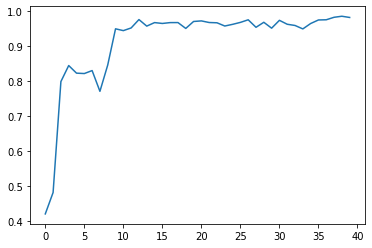

In [13]:
plt.plot(history.history['val_meanAP'])

Calculating Average Precision...: 92it [00:00, 915.90it/s]


Calculating Average Precision for class 1.0


Calculating Average Precision...: 1000it [00:01, 871.01it/s]


Validation meanAP: tf.Tensor(0.986186053301735, shape=(), dtype=float64)


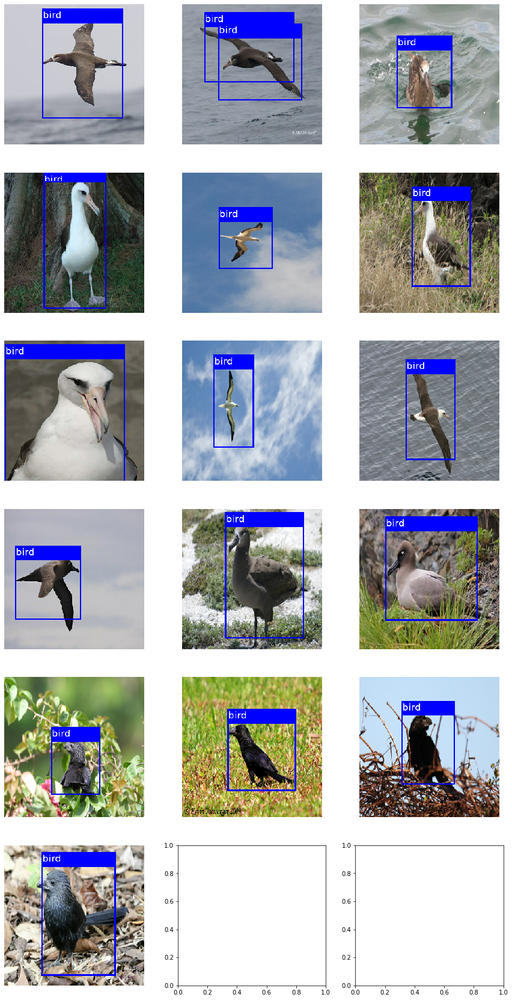

In [14]:
from ssd_utils.metrics import MeanAveragePrecision

mean_AP_metric = MeanAveragePrecision()

model_file = 'mobilenet_finetune.h5'
model.load_weights(model_file)

for x, y_true in valid_data:
    predictions = [output_encoder.decode(y, anchors, model)
                   for y in model(x)]
    ground_truth = [y.to_tensor() for y in y_true]
    mean_AP_metric.update_state(ground_truth, predictions)

print('Validation meanAP:', mean_AP_metric.result())
mean_AP_metric.reset_state()     

num_display = 16
num_cols = 3
num_rows = (num_display+num_cols-1) // num_cols

fig, _ = plt.subplots(num_rows, num_cols, figsize=(5*num_cols, 5*num_rows))

X, Y = next(iter(valid_data))
Y_pred = model(X)

for idx in range(num_display):
    x = X[idx]
    y = output_encoder.decode(Y_pred[idx], anchors, model)
    display_image(x, y, ax=fig.axes[idx])
    
plt.show()

## ResNet50

### Instantiate the model

In [15]:
from ssd_utils.networks.ssd_resnet50 import SSDResNet50

model = SSDResNet50(num_classes=len(config.CLASSES), name='ssd_resnet50')

### Create the data pipelines

In [16]:
anchors = model.get_anchors(image_shape=config.IMAGE_SIZE + (3,))

fake_data = build_dataset(fake_image_paths, fake_bnd_boxes,
                          image_size=config.IMAGE_SIZE,
                          batch_size=config.BATCH_SIZE,
                          repeat=True, shuffle=True,
                          encode_output=True,
                          anchors=anchors,
                          model=model)

train_data = build_dataset(train_image_paths, train_bnd_boxes,
                           image_size=config.IMAGE_SIZE,
                           batch_size=config.BATCH_SIZE,
                           repeat=True, shuffle=True,
                           encode_output=True,
                           anchors=anchors,
                           model=model)

valid_data = build_dataset(valid_image_paths, valid_bnd_boxes,
                           image_size=config.IMAGE_SIZE,
                           batch_size=config.BATCH_SIZE,
                           repeat=False, shuffle=False,
                           encode_output=False)

for data in [fake_data, train_data, valid_data]:
    x, y = next(iter(data))
    print(x.shape, y.shape)

(16, 300, 300, 3) (16, 4149, 6)
(16, 300, 300, 3) (16, 4149, 6)
(16, 300, 300, 3) (16, None, None)


### Pretrain the model on fake data

In [17]:
from ssd_utils.ssd_loss import SSDLoss
from ssd_utils.metrics import MeanAveragePrecision
from tensorflow.keras.callbacks import ModelCheckpoint

from ssd_utils import output_encoder
from utils import MeanAveragePrecisionCallback

ssd_loss = SSDLoss()
        
meanAP_callback = MeanAveragePrecisionCallback(data=valid_data,
                                               anchors=anchors)

ckpt_callback = ModelCheckpoint('resnet50_pretrain.h5',
                                monitor='val_meanAP',
                                mode='max',
                                save_best_only=True,
                                save_weights_only=True)        

        
model.compile(optimizer=tf.keras.optimizers.Adam(1e-4),
              loss=ssd_loss)

history = model.fit(fake_data, epochs=config.NUM_EPOCHS_PRETRAIN,
          steps_per_epoch=config.STEPS_PER_EPOCH,
          callbacks=[meanAP_callback, ckpt_callback])

Epoch 1/40
25/25 [==============================] - ETA: 0s - loss: 16.2644

Calculating Average Precision...: 12it [00:00, 105.58it/s]


Calculating Average Precision for class 1.0


Calculating Average Precision...: 1000it [00:13, 75.14it/s]


25/25 [==============================] - 71s 3s/step - loss: 16.2644 - val_meanAP: 0.0683
Epoch 2/40
25/25 [==============================] - ETA: 0s - loss: 3.5761

Calculating Average Precision...: 11it [00:00, 105.89it/s]


Calculating Average Precision for class 1.0


Calculating Average Precision...: 1000it [00:11, 84.07it/s]

25/25 [==============================] - 67s 3s/step - loss: 3.5761 - val_meanAP: 0.0439


Epoch 3/40
25/25 [==============================] - ETA: 0s - loss: 2.9682

Calculating Average Precision...: 21it [00:00, 197.47it/s]


Calculating Average Precision for class 1.0


Calculating Average Precision...: 1000it [00:06, 147.34it/s]


25/25 [==============================] - 53s 2s/step - loss: 2.9682 - val_meanAP: 0.1945
Epoch 4/40
25/25 [==============================] - ETA: 0s - loss: 2.5498

Calculating Average Precision...: 23it [00:00, 218.40it/s]


Calculating Average Precision for class 1.0


Calculating Average Precision...: 1000it [00:06, 161.94it/s]


25/25 [==============================] - 50s 2s/step - loss: 2.5498 - val_meanAP: 0.2405
Epoch 5/40
25/25 [==============================] - ETA: 0s - loss: 2.2139

Calculating Average Precision...: 29it [00:00, 289.03it/s]


Calculating Average Precision for class 1.0


Calculating Average Precision...: 1000it [00:04, 206.79it/s]


25/25 [==============================] - 47s 2s/step - loss: 2.2139 - val_meanAP: 0.2595
Epoch 6/40
25/25 [==============================] - ETA: 0s - loss: 2.0098

Calculating Average Precision...: 31it [00:00, 301.61it/s]


Calculating Average Precision for class 1.0


Calculating Average Precision...: 1000it [00:04, 221.01it/s]

25/25 [==============================] - 48s 2s/step - loss: 2.0098 - val_meanAP: 0.1430


Epoch 7/40
25/25 [==============================] - ETA: 0s - loss: 1.9044

Calculating Average Precision...: 42it [00:00, 414.56it/s]


Calculating Average Precision for class 1.0


Calculating Average Precision...: 1000it [00:03, 304.26it/s]

25/25 [==============================] - 43s 2s/step - loss: 1.9044 - val_meanAP: 0.1667


Epoch 8/40
25/25 [==============================] - ETA: 0s - loss: 1.7933

Calculating Average Precision...: 48it [00:00, 466.93it/s]


Calculating Average Precision for class 1.0


Calculating Average Precision...: 1000it [00:02, 429.75it/s]

25/25 [==============================] - 40s 2s/step - loss: 1.7933 - val_meanAP: 0.2114


Epoch 9/40
25/25 [==============================] - ETA: 0s - loss: 1.6941

Calculating Average Precision...: 64it [00:00, 635.29it/s]


Calculating Average Precision for class 1.0


Calculating Average Precision...: 1000it [00:02, 452.02it/s]

25/25 [==============================] - 40s 2s/step - loss: 1.6941 - val_meanAP: 0.1569


Epoch 10/40
25/25 [==============================] - ETA: 0s - loss: 1.5349

Calculating Average Precision...: 62it [00:00, 614.75it/s]


Calculating Average Precision for class 1.0


Calculating Average Precision...: 1000it [00:02, 459.80it/s]

25/25 [==============================] - 37s 1s/step - loss: 1.5349 - val_meanAP: 0.1503


Epoch 11/40
25/25 [==============================] - ETA: 0s - loss: 1.4241

Calculating Average Precision...: 51it [00:00, 507.80it/s]


Calculating Average Precision for class 1.0


Calculating Average Precision...: 1000it [00:02, 384.64it/s]

25/25 [==============================] - 38s 2s/step - loss: 1.4241 - val_meanAP: 0.1194


Epoch 12/40
25/25 [==============================] - ETA: 0s - loss: 1.3731

Calculating Average Precision...: 72it [00:00, 710.57it/s]


Calculating Average Precision for class 1.0


Calculating Average Precision...: 1000it [00:01, 642.62it/s]

25/25 [==============================] - 34s 1s/step - loss: 1.3731 - val_meanAP: 0.1194


Epoch 13/40
25/25 [==============================] - ETA: 0s - loss: 1.3454

Calculating Average Precision...: 97it [00:00, 953.42it/s]


Calculating Average Precision for class 1.0


Calculating Average Precision...: 1000it [00:01, 815.57it/s]

25/25 [==============================] - 34s 1s/step - loss: 1.3454 - val_meanAP: 0.1387


Epoch 14/40
25/25 [==============================] - ETA: 0s - loss: 1.2316

Calculating Average Precision...: 95it [00:00, 917.89it/s]


Calculating Average Precision for class 1.0


Calculating Average Precision...: 1000it [00:01, 737.30it/s]

25/25 [==============================] - 34s 1s/step - loss: 1.2316 - val_meanAP: 0.1814


Epoch 15/40
25/25 [==============================] - ETA: 0s - loss: 1.2207

Calculating Average Precision...: 125it [00:00, 1248.56it/s]


Calculating Average Precision for class 1.0


Calculating Average Precision...: 1000it [00:00, 1135.93it/s]

25/25 [==============================] - 33s 1s/step - loss: 1.2207 - val_meanAP: 0.0862


Epoch 16/40
25/25 [==============================] - ETA: 0s - loss: 1.1780

Calculating Average Precision...: 89it [00:00, 884.01it/s]


Calculating Average Precision for class 1.0


Calculating Average Precision...: 1000it [00:01, 870.30it/s]

25/25 [==============================] - 35s 1s/step - loss: 1.1780 - val_meanAP: 0.1191


Epoch 17/40
25/25 [==============================] - ETA: 0s - loss: 1.0910

Calculating Average Precision...: 101it [00:00, 996.95it/s]


Calculating Average Precision for class 1.0


Calculating Average Precision...: 1000it [00:01, 892.58it/s]

25/25 [==============================] - 35s 1s/step - loss: 1.0910 - val_meanAP: 0.1103


Epoch 18/40
25/25 [==============================] - ETA: 0s - loss: 1.1014

Calculating Average Precision...: 128it [00:00, 1259.46it/s]


Calculating Average Precision for class 1.0


Calculating Average Precision...: 1000it [00:00, 1236.90it/s]

25/25 [==============================] - 34s 1s/step - loss: 1.1014 - val_meanAP: 0.0642


Epoch 19/40
25/25 [==============================] - ETA: 0s - loss: 1.0406

Calculating Average Precision...: 167it [00:00, 1631.63it/s]


Calculating Average Precision for class 1.0


Calculating Average Precision...: 1000it [00:00, 1395.29it/s]

25/25 [==============================] - 32s 1s/step - loss: 1.0406 - val_meanAP: 0.0662


Epoch 20/40
25/25 [==============================] - ETA: 0s - loss: 1.0583

Calculating Average Precision...: 141it [00:00, 1409.28it/s]


Calculating Average Precision for class 1.0


Calculating Average Precision...: 1000it [00:00, 1332.60it/s]

25/25 [==============================] - 35s 1s/step - loss: 1.0583 - val_meanAP: 0.0478


Epoch 21/40
25/25 [==============================] - ETA: 0s - loss: 1.0051

Calculating Average Precision...: 155it [00:00, 1540.63it/s]


Calculating Average Precision for class 1.0


Calculating Average Precision...: 1000it [00:00, 1405.63it/s]

25/25 [==============================] - 33s 1s/step - loss: 1.0051 - val_meanAP: 0.0344


Epoch 22/40
25/25 [==============================] - ETA: 0s - loss: 1.0407

Calculating Average Precision...: 245it [00:00, 2427.57it/s]


Calculating Average Precision for class 1.0


Calculating Average Precision...: 1000it [00:00, 2421.71it/s]

25/25 [==============================] - 31s 1s/step - loss: 1.0407 - val_meanAP: 0.0237


Epoch 23/40
25/25 [==============================] - ETA: 0s - loss: 0.9979

Calculating Average Precision...: 245it [00:00, 2430.97it/s]


Calculating Average Precision for class 1.0


Calculating Average Precision...: 1000it [00:00, 2170.18it/s]

25/25 [==============================] - 33s 1s/step - loss: 0.9979 - val_meanAP: 0.0382


Epoch 24/40
25/25 [==============================] - ETA: 0s - loss: 0.9577

Calculating Average Precision...: 262it [00:00, 2599.35it/s]


Calculating Average Precision for class 1.0


Calculating Average Precision...: 1000it [00:00, 2809.07it/s]

25/25 [==============================] - 31s 1s/step - loss: 0.9577 - val_meanAP: 0.0238


Epoch 25/40
25/25 [==============================] - ETA: 0s - loss: 0.9320

Calculating Average Precision...: 155it [00:00, 1537.47it/s]


Calculating Average Precision for class 1.0


Calculating Average Precision...: 1000it [00:00, 1625.92it/s]

25/25 [==============================] - 31s 1s/step - loss: 0.9320 - val_meanAP: 0.0498


Epoch 26/40
25/25 [==============================] - ETA: 0s - loss: 0.9755

Calculating Average Precision...: 261it [00:00, 2595.57it/s]


Calculating Average Precision for class 1.0


Calculating Average Precision...: 1000it [00:00, 2189.53it/s]

25/25 [==============================] - 30s 1s/step - loss: 0.9755 - val_meanAP: 0.0372


Epoch 27/40
25/25 [==============================] - ETA: 0s - loss: 0.9130

Calculating Average Precision...: 297it [00:00, 2931.14it/s]


Calculating Average Precision for class 1.0


Calculating Average Precision...: 1000it [00:00, 2296.86it/s]

25/25 [==============================] - 30s 1s/step - loss: 0.9130 - val_meanAP: 0.0263


Epoch 28/40
25/25 [==============================] - ETA: 0s - loss: 0.8999

Calculating Average Precision...: 498it [00:00, 4973.13it/s]


Calculating Average Precision for class 1.0


Calculating Average Precision...: 1000it [00:00, 4194.30it/s]

25/25 [==============================] - 28s 1s/step - loss: 0.8999 - val_meanAP: 0.0087


Epoch 29/40
25/25 [==============================] - ETA: 0s - loss: 0.8146

Calculating Average Precision...: 276it [00:00, 2749.21it/s]


Calculating Average Precision for class 1.0


Calculating Average Precision...: 1000it [00:00, 2456.14it/s]

25/25 [==============================] - 29s 1s/step - loss: 0.8146 - val_meanAP: 0.0317


Epoch 30/40
25/25 [==============================] - ETA: 0s - loss: 0.9026

Calculating Average Precision...: 192it [00:00, 1919.94it/s]


Calculating Average Precision for class 1.0


Calculating Average Precision...: 1000it [00:00, 1800.77it/s]

25/25 [==============================] - 31s 1s/step - loss: 0.9026 - val_meanAP: 0.0537


Epoch 31/40
25/25 [==============================] - ETA: 0s - loss: 0.8260

Calculating Average Precision...: 1000it [00:00, 5241.69it/s]


Calculating Average Precision for class 1.0
25/25 [==============================] - 28s 1s/step - loss: 0.8260 - val_meanAP: 0.0053


Epoch 32/40
25/25 [==============================] - ETA: 0s - loss: 0.8297

Calculating Average Precision...: 205it [00:00, 1996.24it/s]


Calculating Average Precision for class 1.0


Calculating Average Precision...: 1000it [00:00, 2312.78it/s]

25/25 [==============================] - 30s 1s/step - loss: 0.8297 - val_meanAP: 0.0306


Epoch 33/40
25/25 [==============================] - ETA: 0s - loss: 0.8002

Calculating Average Precision...: 551it [00:00, 5471.47it/s]


Calculating Average Precision for class 1.0


Calculating Average Precision...: 1000it [00:00, 4899.70it/s]

25/25 [==============================] - 28s 1s/step - loss: 0.8002 - val_meanAP: 0.0069


Epoch 34/40
25/25 [==============================] - ETA: 0s - loss: 0.7487

Calculating Average Precision...: 1000it [00:00, 5650.32it/s]


Calculating Average Precision for class 1.0
25/25 [==============================] - 28s 1s/step - loss: 0.7487 - val_meanAP: 0.0060
Epoch 35/40


25/25 [==============================] - ETA: 0s - loss: 0.7070

Calculating Average Precision...: 1000it [00:00, 8081.95it/s]


Calculating Average Precision for class 1.0
25/25 [==============================] - 28s 1s/step - loss: 0.7070 - val_meanAP: 0.0050
Epoch 36/40


25/25 [==============================] - ETA: 0s - loss: 0.7216

Calculating Average Precision...: 331it [00:00, 3276.13it/s]


Calculating Average Precision for class 1.0


Calculating Average Precision...: 1000it [00:00, 3384.29it/s]

25/25 [==============================] - 29s 1s/step - loss: 0.7216 - val_meanAP: 0.0169


Epoch 37/40
25/25 [==============================] - ETA: 0s - loss: 0.7280

Calculating Average Precision...: 493it [00:00, 4891.46it/s]


Calculating Average Precision for class 1.0


Calculating Average Precision...: 1000it [00:00, 4520.38it/s]

25/25 [==============================] - 28s 1s/step - loss: 0.7280 - val_meanAP: 0.0050


Epoch 38/40
25/25 [==============================] - ETA: 0s - loss: 0.7094

Calculating Average Precision...: 462it [00:00, 4599.17it/s]


Calculating Average Precision for class 1.0


Calculating Average Precision...: 1000it [00:00, 3667.56it/s]

25/25 [==============================] - 28s 1s/step - loss: 0.7094 - val_meanAP: 0.0115


Epoch 39/40
25/25 [==============================] - ETA: 0s - loss: 0.6293

Calculating Average Precision...: 329it [00:00, 3285.49it/s]


Calculating Average Precision for class 1.0


Calculating Average Precision...: 1000it [00:00, 2615.66it/s]

25/25 [==============================] - 30s 1s/step - loss: 0.6293 - val_meanAP: 0.0180


Epoch 40/40
25/25 [==============================] - ETA: 0s - loss: 0.6536

Calculating Average Precision...: 1000it [00:00, 6705.40it/s]


Calculating Average Precision for class 1.0
25/25 [==============================] - 28s 1s/step - loss: 0.6536 - val_meanAP: 0.0076


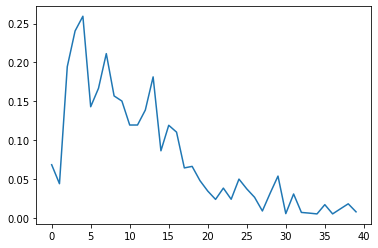

In [18]:
plt.plot(history.history['val_meanAP'])

Calculating Average Precision...: 28it [00:00, 273.67it/s]


Calculating Average Precision for class 1.0


Calculating Average Precision...: 1000it [00:04, 202.94it/s]


Validation meanAP: tf.Tensor(0.25949466888652944, shape=(), dtype=float64)


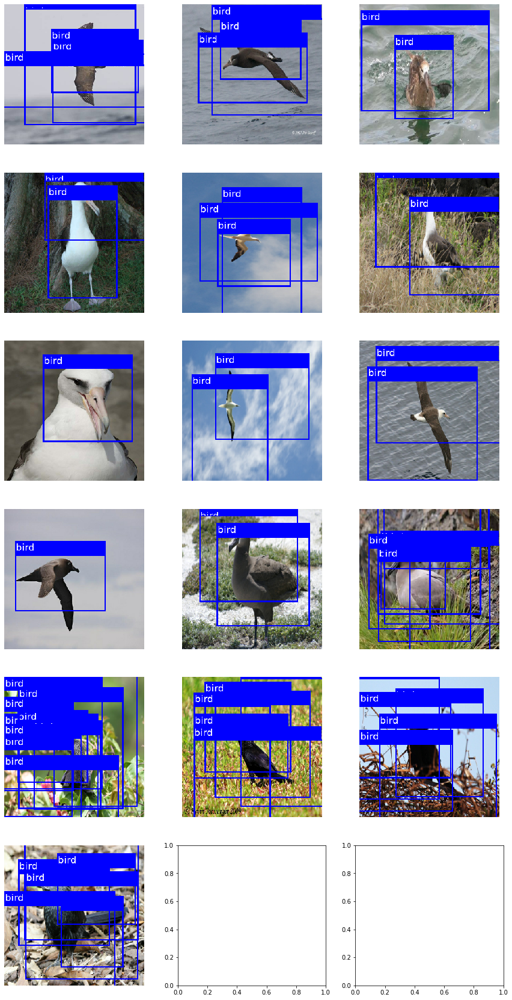

In [19]:
from ssd_utils.metrics import MeanAveragePrecision

mean_AP_metric = MeanAveragePrecision()

model_file = 'resnet50_pretrain.h5'
model.load_weights(model_file)

for x, y_true in valid_data:
    predictions = [output_encoder.decode(y, anchors, model)
                   for y in model(x)]
    ground_truth = [y.to_tensor() for y in y_true]
    mean_AP_metric.update_state(ground_truth, predictions)

print('Validation meanAP:', mean_AP_metric.result())
mean_AP_metric.reset_state()     

num_display = 16
num_cols = 3
num_rows = (num_display+num_cols-1) // num_cols

fig, _ = plt.subplots(num_rows, num_cols, figsize=(5*num_cols, 5*num_rows))

X, Y = next(iter(valid_data))
Y_pred = model(X)

for idx in range(num_display):
    x = X[idx]
    y = output_encoder.decode(Y_pred[idx], anchors, model)
    display_image(x, y, ax=fig.axes[idx])
    
plt.show()


### Fintetune the model on real data

In [20]:
from ssd_utils.ssd_loss import SSDLoss
from ssd_utils.metrics import MeanAveragePrecision
from tensorflow.keras.callbacks import ModelCheckpoint

from ssd_utils import output_encoder
from utils import MeanAveragePrecisionCallback

ssd_loss = SSDLoss()
        
meanAP_callback = MeanAveragePrecisionCallback(data=valid_data,
                                               anchors=anchors)

ckpt_callback = ModelCheckpoint('resnet50_finetune.h5',
                                monitor='val_meanAP',
                                mode='max',
                                save_best_only=True,
                                save_weights_only=True)        

        
model.compile(optimizer=tf.keras.optimizers.Adam(1e-4),
              loss=ssd_loss)

history = model.fit(train_data, epochs=config.NUM_EPOCHS,
          steps_per_epoch=config.STEPS_PER_EPOCH,
          callbacks=[meanAP_callback, ckpt_callback])

Epoch 1/40
25/25 [==============================] - ETA: 0s - loss: 1.8789

Calculating Average Precision...: 30it [00:00, 297.40it/s]


Calculating Average Precision for class 1.0


Calculating Average Precision...: 1000it [00:02, 344.07it/s]


25/25 [==============================] - 40s 2s/step - loss: 1.8789 - val_meanAP: 0.6793
Epoch 2/40
25/25 [==============================] - ETA: 0s - loss: 1.4301

Calculating Average Precision...: 26it [00:00, 251.96it/s]


Calculating Average Precision for class 1.0


Calculating Average Precision...: 1000it [00:03, 308.39it/s]


25/25 [==============================] - 47s 2s/step - loss: 1.4301 - val_meanAP: 0.8359
Epoch 3/40
25/25 [==============================] - ETA: 0s - loss: 1.3060

Calculating Average Precision...: 35it [00:00, 347.83it/s]


Calculating Average Precision for class 1.0


Calculating Average Precision...: 1000it [00:02, 334.23it/s]


25/25 [==============================] - 49s 2s/step - loss: 1.3060 - val_meanAP: 0.8695
Epoch 4/40
25/25 [==============================] - ETA: 0s - loss: 1.0608

Calculating Average Precision...: 34it [00:00, 339.05it/s]


Calculating Average Precision for class 1.0


Calculating Average Precision...: 1000it [00:02, 373.20it/s]


25/25 [==============================] - 50s 2s/step - loss: 1.0608 - val_meanAP: 0.8944
Epoch 5/40
25/25 [==============================] - ETA: 0s - loss: 1.0796

Calculating Average Precision...: 41it [00:00, 407.85it/s]


Calculating Average Precision for class 1.0


Calculating Average Precision...: 1000it [00:01, 531.32it/s]


25/25 [==============================] - 48s 2s/step - loss: 1.0796 - val_meanAP: 0.9561
Epoch 6/40
25/25 [==============================] - ETA: 0s - loss: 1.1046

Calculating Average Precision...: 49it [00:00, 489.03it/s]


Calculating Average Precision for class 1.0


Calculating Average Precision...: 1000it [00:02, 485.79it/s]


25/25 [==============================] - 48s 2s/step - loss: 1.1046 - val_meanAP: 0.9635
Epoch 7/40
25/25 [==============================] - ETA: 0s - loss: 1.0178

Calculating Average Precision...: 62it [00:00, 614.57it/s]


Calculating Average Precision for class 1.0


Calculating Average Precision...: 1000it [00:01, 582.47it/s]


25/25 [==============================] - 45s 2s/step - loss: 1.0178 - val_meanAP: 0.9666
Epoch 8/40
25/25 [==============================] - ETA: 0s - loss: 0.6920

Calculating Average Precision...: 64it [00:00, 637.50it/s]


Calculating Average Precision for class 1.0


Calculating Average Precision...: 1000it [00:01, 625.14it/s]

25/25 [==============================] - 42s 2s/step - loss: 0.6920 - val_meanAP: 0.9604


Epoch 9/40
25/25 [==============================] - ETA: 0s - loss: 0.7911

Calculating Average Precision...: 75it [00:00, 749.15it/s]


Calculating Average Precision for class 1.0


Calculating Average Precision...: 1000it [00:01, 722.28it/s]


25/25 [==============================] - 44s 2s/step - loss: 0.7911 - val_meanAP: 0.9749
Epoch 10/40
25/25 [==============================] - ETA: 0s - loss: 0.7876

Calculating Average Precision...: 82it [00:00, 814.45it/s]


Calculating Average Precision for class 1.0


Calculating Average Precision...: 1000it [00:01, 748.14it/s]


25/25 [==============================] - 44s 2s/step - loss: 0.7876 - val_meanAP: 0.9766
Epoch 11/40
25/25 [==============================] - ETA: 0s - loss: 0.7356

Calculating Average Precision...: 83it [00:00, 829.03it/s]


Calculating Average Precision for class 1.0


Calculating Average Precision...: 1000it [00:01, 729.36it/s]

25/25 [==============================] - 48s 2s/step - loss: 0.7356 - val_meanAP: 0.9565


Epoch 12/40
25/25 [==============================] - ETA: 0s - loss: 0.7274

Calculating Average Precision...: 69it [00:00, 680.88it/s]


Calculating Average Precision for class 1.0


Calculating Average Precision...: 1000it [00:01, 779.40it/s]

25/25 [==============================] - 42s 2s/step - loss: 0.7274 - val_meanAP: 0.9765


Epoch 13/40
25/25 [==============================] - ETA: 0s - loss: 0.7851

Calculating Average Precision...: 77it [00:00, 761.51it/s]


Calculating Average Precision for class 1.0


Calculating Average Precision...: 1000it [00:01, 857.62it/s]

25/25 [==============================] - 38s 2s/step - loss: 0.7851 - val_meanAP: 0.9699


Epoch 14/40
25/25 [==============================] - ETA: 0s - loss: 0.6770

Calculating Average Precision...: 89it [00:00, 889.07it/s]


Calculating Average Precision for class 1.0


Calculating Average Precision...: 1000it [00:01, 924.48it/s]


25/25 [==============================] - 37s 1s/step - loss: 0.6770 - val_meanAP: 0.9819
Epoch 15/40
25/25 [==============================] - ETA: 0s - loss: 0.5680

Calculating Average Precision...: 85it [00:00, 843.40it/s]


Calculating Average Precision for class 1.0


Calculating Average Precision...: 1000it [00:01, 861.69it/s]


25/25 [==============================] - 43s 2s/step - loss: 0.5680 - val_meanAP: 0.9881
Epoch 16/40
25/25 [==============================] - ETA: 0s - loss: 0.5639

Calculating Average Precision...: 80it [00:00, 799.44it/s]


Calculating Average Precision for class 1.0


Calculating Average Precision...: 1000it [00:01, 787.79it/s]

25/25 [==============================] - 41s 2s/step - loss: 0.5639 - val_meanAP: 0.9848


Epoch 17/40
25/25 [==============================] - ETA: 0s - loss: 0.4777

Calculating Average Precision...: 72it [00:00, 719.16it/s]


Calculating Average Precision for class 1.0


Calculating Average Precision...: 1000it [00:01, 788.67it/s]

25/25 [==============================] - 44s 2s/step - loss: 0.4777 - val_meanAP: 0.9879


Epoch 18/40
25/25 [==============================] - ETA: 0s - loss: 0.6440

Calculating Average Precision...: 95it [00:00, 936.31it/s]


Calculating Average Precision for class 1.0


Calculating Average Precision...: 1000it [00:01, 871.20it/s]

25/25 [==============================] - 41s 2s/step - loss: 0.6440 - val_meanAP: 0.9730


Epoch 19/40
25/25 [==============================] - ETA: 0s - loss: 0.6417

Calculating Average Precision...: 88it [00:00, 879.62it/s]


Calculating Average Precision for class 1.0


Calculating Average Precision...: 1000it [00:01, 903.04it/s]

25/25 [==============================] - 40s 2s/step - loss: 0.6417 - val_meanAP: 0.9706


Epoch 20/40
25/25 [==============================] - ETA: 0s - loss: 0.5752

Calculating Average Precision...: 84it [00:00, 837.16it/s]


Calculating Average Precision for class 1.0


Calculating Average Precision...: 1000it [00:01, 833.90it/s]

25/25 [==============================] - 41s 2s/step - loss: 0.5752 - val_meanAP: 0.9724


Epoch 21/40
25/25 [==============================] - ETA: 0s - loss: 0.5312

Calculating Average Precision...: 74it [00:00, 733.88it/s]


Calculating Average Precision for class 1.0


Calculating Average Precision...: 1000it [00:01, 794.70it/s]

25/25 [==============================] - 41s 2s/step - loss: 0.5312 - val_meanAP: 0.9880


Epoch 22/40
25/25 [==============================] - ETA: 0s - loss: 0.4847

Calculating Average Precision...: 75it [00:00, 739.37it/s]


Calculating Average Precision for class 1.0


Calculating Average Precision...: 1000it [00:01, 798.74it/s]

25/25 [==============================] - 41s 2s/step - loss: 0.4847 - val_meanAP: 0.9830


Epoch 23/40
25/25 [==============================] - ETA: 0s - loss: 0.4707

Calculating Average Precision...: 71it [00:00, 699.50it/s]


Calculating Average Precision for class 1.0


Calculating Average Precision...: 1000it [00:01, 782.53it/s]

25/25 [==============================] - 43s 2s/step - loss: 0.4707 - val_meanAP: 0.9812


Epoch 24/40
25/25 [==============================] - ETA: 0s - loss: 0.5062

Calculating Average Precision...: 87it [00:00, 864.97it/s]


Calculating Average Precision for class 1.0


Calculating Average Precision...: 1000it [00:00, 1003.79it/s]

25/25 [==============================] - 40s 2s/step - loss: 0.5062 - val_meanAP: 0.9827


Epoch 25/40
25/25 [==============================] - ETA: 0s - loss: 0.7238

Calculating Average Precision...: 80it [00:00, 798.33it/s]


Calculating Average Precision for class 1.0


Calculating Average Precision...: 1000it [00:01, 828.96it/s]

25/25 [==============================] - 42s 2s/step - loss: 0.7238 - val_meanAP: 0.9694


Epoch 26/40
25/25 [==============================] - ETA: 0s - loss: 0.5897

Calculating Average Precision...: 86it [00:00, 855.90it/s]


Calculating Average Precision for class 1.0


Calculating Average Precision...: 1000it [00:01, 801.96it/s]

25/25 [==============================] - 40s 2s/step - loss: 0.5897 - val_meanAP: 0.9755


Epoch 27/40
25/25 [==============================] - ETA: 0s - loss: 0.6156

Calculating Average Precision...: 90it [00:00, 898.64it/s]


Calculating Average Precision for class 1.0


Calculating Average Precision...: 1000it [00:01, 925.35it/s]

25/25 [==============================] - 36s 1s/step - loss: 0.6156 - val_meanAP: 0.9677


Epoch 28/40
25/25 [==============================] - ETA: 0s - loss: 0.5123

Calculating Average Precision...: 82it [00:00, 814.99it/s]


Calculating Average Precision for class 1.0


Calculating Average Precision...: 1000it [00:01, 822.98it/s]

25/25 [==============================] - 36s 1s/step - loss: 0.5123 - val_meanAP: 0.9779


Epoch 29/40
25/25 [==============================] - ETA: 0s - loss: 0.6050

Calculating Average Precision...: 92it [00:00, 914.36it/s]


Calculating Average Precision for class 1.0


Calculating Average Precision...: 1000it [00:01, 855.64it/s]

25/25 [==============================] - 35s 1s/step - loss: 0.6050 - val_meanAP: 0.9869


Epoch 30/40
25/25 [==============================] - ETA: 0s - loss: 0.4421

Calculating Average Precision...: 84it [00:00, 833.07it/s]


Calculating Average Precision for class 1.0


Calculating Average Precision...: 1000it [00:01, 854.25it/s]

25/25 [==============================] - 36s 1s/step - loss: 0.4421 - val_meanAP: 0.9767


Epoch 31/40
25/25 [==============================] - ETA: 0s - loss: 0.4347

Calculating Average Precision...: 80it [00:00, 796.85it/s]


Calculating Average Precision for class 1.0


Calculating Average Precision...: 1000it [00:01, 883.68it/s]

25/25 [==============================] - 35s 1s/step - loss: 0.4347 - val_meanAP: 0.9854


Epoch 32/40
25/25 [==============================] - ETA: 0s - loss: 0.5368

Calculating Average Precision...: 73it [00:00, 723.37it/s]


Calculating Average Precision for class 1.0


Calculating Average Precision...: 1000it [00:01, 819.11it/s]

25/25 [==============================] - 36s 1s/step - loss: 0.5368 - val_meanAP: 0.9761


Epoch 33/40
25/25 [==============================] - ETA: 0s - loss: 0.5151

Calculating Average Precision...: 98it [00:00, 979.71it/s]


Calculating Average Precision for class 1.0


Calculating Average Precision...: 1000it [00:01, 873.57it/s]

25/25 [==============================] - 35s 1s/step - loss: 0.5151 - val_meanAP: 0.9730


Epoch 34/40
25/25 [==============================] - ETA: 0s - loss: 0.3511

Calculating Average Precision...: 84it [00:00, 831.91it/s]


Calculating Average Precision for class 1.0


Calculating Average Precision...: 1000it [00:01, 822.14it/s]

25/25 [==============================] - 36s 1s/step - loss: 0.3511 - val_meanAP: 0.9743


Epoch 35/40
25/25 [==============================] - ETA: 0s - loss: 0.4234

Calculating Average Precision...: 79it [00:00, 789.29it/s]


Calculating Average Precision for class 1.0


Calculating Average Precision...: 1000it [00:01, 868.26it/s]

25/25 [==============================] - 36s 1s/step - loss: 0.4234 - val_meanAP: 0.9879


Epoch 36/40
25/25 [==============================] - ETA: 0s - loss: 0.3788

Calculating Average Precision...: 80it [00:00, 797.92it/s]


Calculating Average Precision for class 1.0


Calculating Average Precision...: 1000it [00:01, 741.63it/s]

25/25 [==============================] - 37s 1s/step - loss: 0.3788 - val_meanAP: 0.9880


Epoch 37/40
25/25 [==============================] - ETA: 0s - loss: 0.3780

Calculating Average Precision...: 73it [00:00, 721.57it/s]


Calculating Average Precision for class 1.0


Calculating Average Precision...: 1000it [00:01, 718.62it/s]

25/25 [==============================] - 41s 2s/step - loss: 0.3780 - val_meanAP: 0.9860


Epoch 38/40
25/25 [==============================] - ETA: 0s - loss: 0.3406

Calculating Average Precision...: 84it [00:00, 839.91it/s]


Calculating Average Precision for class 1.0


Calculating Average Precision...: 1000it [00:01, 873.44it/s]


25/25 [==============================] - 46s 2s/step - loss: 0.3406 - val_meanAP: 0.9906
Epoch 39/40
25/25 [==============================] - ETA: 0s - loss: 0.3555

Calculating Average Precision...: 81it [00:00, 801.88it/s]


Calculating Average Precision for class 1.0


Calculating Average Precision...: 1000it [00:01, 891.78it/s]

25/25 [==============================] - 37s 1s/step - loss: 0.3555 - val_meanAP: 0.9893


Epoch 40/40
25/25 [==============================] - ETA: 0s - loss: 0.3137

Calculating Average Precision...: 80it [00:00, 797.68it/s]


Calculating Average Precision for class 1.0


Calculating Average Precision...: 1000it [00:01, 921.16it/s]

25/25 [==============================] - 36s 1s/step - loss: 0.3137 - val_meanAP: 0.9894


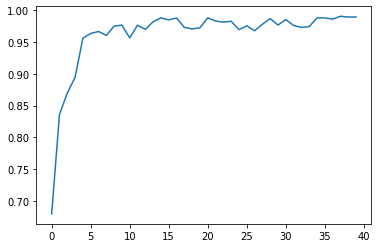

In [21]:
plt.plot(history.history['val_meanAP'])

Calculating Average Precision...: 90it [00:00, 894.20it/s]


Calculating Average Precision for class 1.0


Calculating Average Precision...: 1000it [00:01, 895.88it/s]


Validation meanAP: tf.Tensor(0.990575132016071, shape=(), dtype=float64)


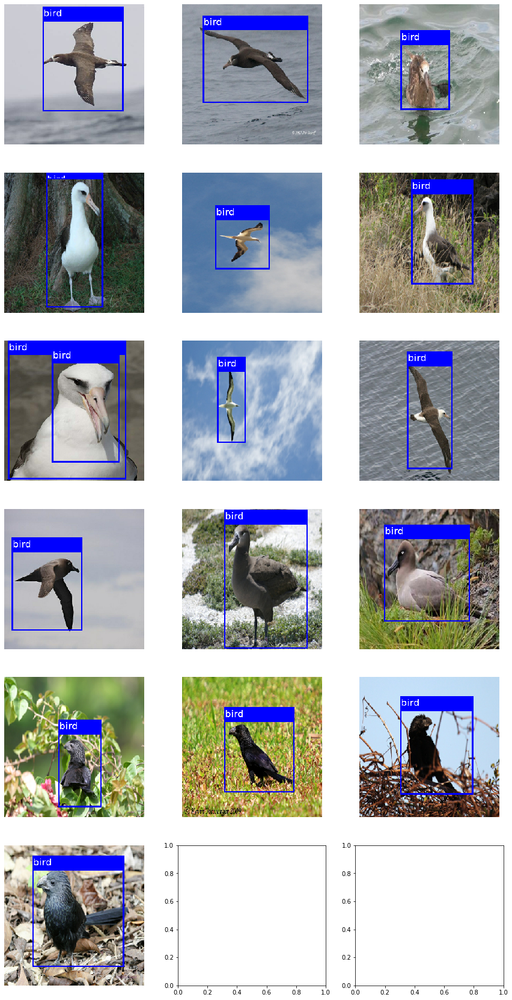

In [22]:
from ssd_utils.metrics import MeanAveragePrecision

mean_AP_metric = MeanAveragePrecision()

model_file = 'resnet50_finetune.h5'
model.load_weights(model_file)

for x, y_true in valid_data:
    predictions = [output_encoder.decode(y, anchors, model)
                   for y in model(x)]
    ground_truth = [y.to_tensor() for y in y_true]
    mean_AP_metric.update_state(ground_truth, predictions)

print('Validation meanAP:', mean_AP_metric.result())
mean_AP_metric.reset_state()     

num_display = 16
num_cols = 3
num_rows = (num_display+num_cols-1) // num_cols

fig, _ = plt.subplots(num_rows, num_cols, figsize=(5*num_cols, 5*num_rows))

X, Y = next(iter(valid_data))
Y_pred = model(X)

for idx in range(num_display):
    x = X[idx]
    y = output_encoder.decode(Y_pred[idx], anchors, model)
    display_image(x, y, ax=fig.axes[idx])
    
plt.show()